# Predicting housing prices in King County
**Task:** Using the King County house sale price dataset
1. Identify the features which are related to price, and 
2. Build a model to predict house prices in King County. 

In [1]:
# Import relevant libraries
import numpy as np 
import numpy.linalg

import pandas as pd
pd.options.display.max_columns = None


import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.graphics.factorplots import interaction_plot
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from scipy.stats import shapiro
from scipy import stats

from sklearn import metrics, preprocessing, feature_selection, linear_model, model_selection
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance
from sklearn.compose import ColumnTransformer


import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

from IPython.display import display

import seaborn as sns
sns.set_style("ticks")


import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px
pio.templates.default = "plotly_white"

/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# 1. Import file and check data

Data from https://www.kaggle.com/harlfoxem/housesalesprediction

In [2]:
# Read Excel data file
df = pd.read_csv('kc_house_data.csv')

# Preview df
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


# 2. Exploratory Data Analysis

## 2.1 Describe dataset

There are 21313 observations (rows) and 21 variables (columns).

**Identifiers**
1. `Id` Unique ID for each home sold

**Dates**
2. `Date` Date of the home sale
15. `Yr_built` The year the house was initially built
16. `Yr_renovated` The year of the house’s last renovation

**Numerical**
3. `Price` Price of each home sold
4. `Bedrooms` Number of bedrooms
5. `Bathrooms` Number of bathrooms, (0.5 = toilet only, 0.75 = toilet + shower)
6. `Sqft_living` Square footage of the apartments interior living space
7. `Sqft_lot` Square footage of the land space
8. `Floors` Number of floors
13. `Sqft_above` The square footage of the interior housing space that is above ground level
14. `Sqft_basement` The square footage of the interior housing space that is below ground level
20. `Sqft_living15` The square footage of interior housing living space for the nearest 15 neighbors
21. `Sqft_lot15` The square footage of the land lots of the nearest 15 neighbors

**Categorical**

9. `Waterfront` A dummy variable for whether the apartment was overlooking the waterfront or not
10. `View` An index from 0 to 4 of how good the view of the property was
11. `Condition` An index from 1 (poor) to 5 (very good) on the condition of the apartment
12. `Grade` An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11- 13 have a high quality level of construction and design

**Location**
17. `Zipcode` What zipcode area the house is in
18. `Lat` Lattitude
19. `Long` Longitude


In [3]:
### Show dataset shape and format
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [4]:
# Show descriptive stats
df.describe(include='all')

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21613,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
unique,NaN,372,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,20140623T000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,4.580302e+09,NaN,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,NaN,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,NaN,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,NaN,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,NaN,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,NaN,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000


## 2.2 Checking missing values

There are no missing values.

In [5]:
# Show fields with missing values

print("% of missing values:")
df.isnull().sum().sort_values(ascending = False)/len(df)

% of missing values:


id               0.0
grade            0.0
sqft_living15    0.0
long             0.0
lat              0.0
zipcode          0.0
yr_renovated     0.0
yr_built         0.0
sqft_basement    0.0
sqft_above       0.0
condition        0.0
date             0.0
view             0.0
waterfront       0.0
floors           0.0
sqft_lot         0.0
sqft_living      0.0
bathrooms        0.0
bedrooms         0.0
price            0.0
sqft_lot15       0.0
dtype: float64

## 2.3 Checking for outliers

### 2.3.1 Outliers in `bedrooms`: clean one entry
Notice that `bedrooms` has one row with 33 bedrooms. Houses in the vicinity with similar `sqft_living` have around 2 to 4 bedrooms, hence it is likely a data entry error. We change the number of `bedrooms` for `id` == 15870 to 3.

In [6]:
# Show entry with 33 bedrooms (before cleaning)
print("+++ Entry with 33 bedrooms +++")
print(df.loc[df['bedrooms'] == 33])

# Show id == 2402100895 with 33 bedrooms (after cleaning)
df['bedrooms'] = df['bedrooms'].replace([33],3)
print("+++ Cleaned entry +++")
df.loc[df['id'] == 2402100895]

+++ Entry with 33 bedrooms +++
               id             date     price  bedrooms  bathrooms  \
15870  2402100895  20140625T000000  640000.0        33       1.75   

       sqft_living  sqft_lot  floors  waterfront  view  condition  grade  \
15870         1620      6000     1.0           0     0          5      7   

       sqft_above  sqft_basement  yr_built  yr_renovated  zipcode      lat  \
15870        1040            580      1947             0    98103  47.6878   

          long  sqft_living15  sqft_lot15  
15870 -122.331           1330        4700  
+++ Cleaned entry +++


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,2402100895,20140625T000000,640000.0,3,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700


### 2.3.2 Outliers in `bathrooms`: drop entries where `bathrooms` = 0
There are 10 entries where the houses have no bathrooms. While it could be a data entry error, it's also possible that the house does not have an attached bathroom (e.g. shared living spaces, which should be priced differently from normal houses). Given the uncertainty, we drop the 10 rows which should be inconsequential.

In [7]:
# Rows in original dataset
print("Rows before dropping entries with 0 bathrooms: {}".format(df.shape[0]))

# drop entries where `bathrooms` = 0
df.drop(df[df['bathrooms'] == 0].index, inplace=True)
print("Rows after dropping entries with 0 bathrooms: {}".format(df.shape[0]))

Rows before dropping entries with 0 bathrooms: 21613
Rows after dropping entries with 0 bathrooms: 21603


### 2.3.3 Outliers in `price`: keep as they appear to be related to `grade`, `condition` and `view`
1. We notice many outliers with high prices. From the interactive boxplot below, we decide to keep these entries as they appear to be houses with higher `grade`, `condition` and `view` scores.
2. Also, we note that `price` does not seem to follow a normal distribution.

In [8]:
# Plot interactive boxplot

fig = px.histogram(df, x="price", marginal="box",
                   hover_data=['grade','condition','view'],
                   title="Housing prices")
fig.show()

In [9]:
# Plot price curve

px.scatter(df, y = np.sort(df['price'].values))

## 2.3 Analyse relationships between variables

From the heatmap and correlation matrix, we notice
1. **Variables moderately correlated to `price`**: Individually, `sqft_living`, `sqft_above`, `sqft_living15`, `bathrooms` and `grade` have moderate r scores and are likely to be good predictors.
2. **Notable correlations among variables which may pose multicollinearity problems**
     * `sqft_living` and `sqft_above` are highly correlated. We likely have to drop one variable as they are quite similar.
     * `bedrooms`, `bathrooms`, `sqft_living`, `sqft_above` and `grade` are moderately correlated. Not surprising, since the number of bedrooms and bathrooms are expected to increase with living space. Overall design including `bedrooms`, `bathrooms` would probably have made a difference on `grade`.
     * `sqft_living15` is moderately correlated with `bathrooms`, `sqft_living`, `sqft_above` and `grade`. This suggests that homes in the vicinty would likely have similar `sqft_living`, `sqft_above` and `grade` characteristics, though `bedrooms` may vary.

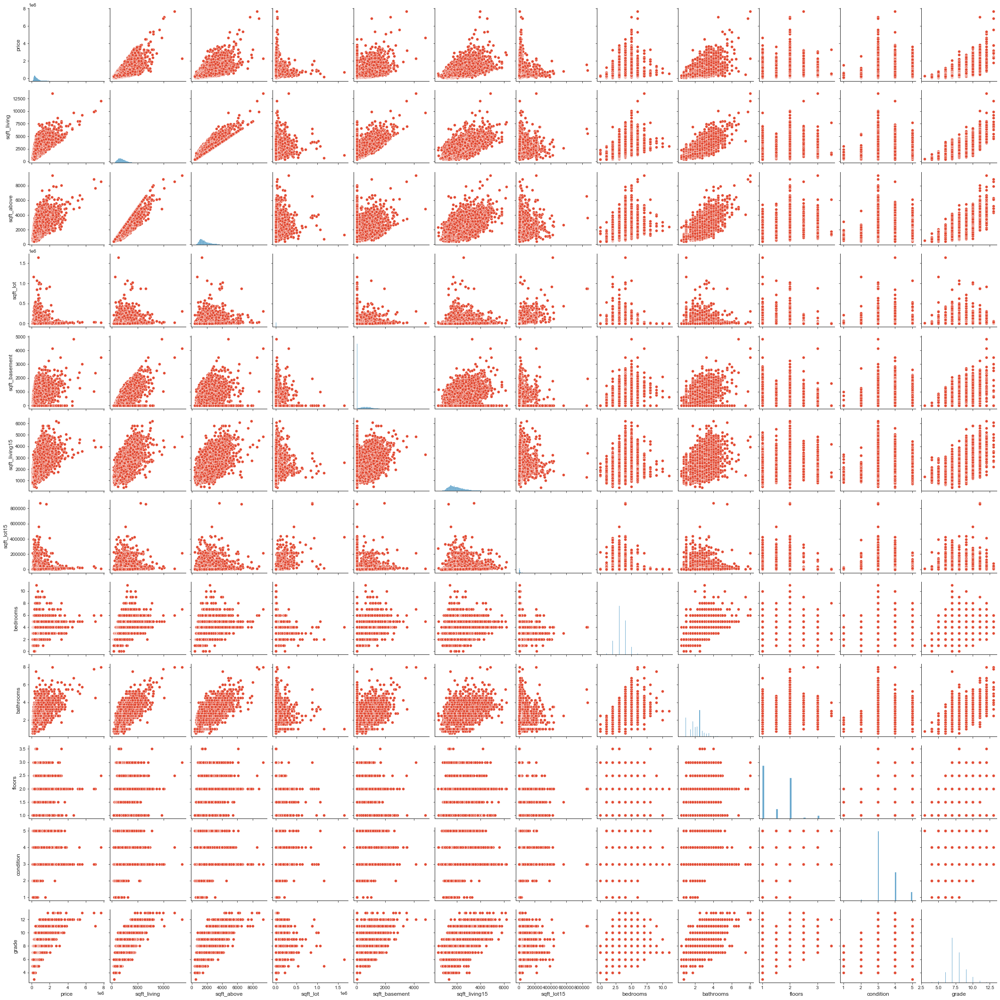

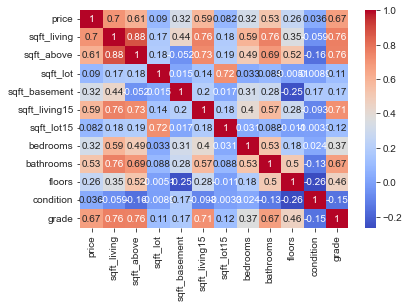

In [10]:
# Pairplot
df_pairplot1 = df[['price','sqft_living','sqft_above','sqft_lot','sqft_basement','sqft_living15','sqft_lot15','bedrooms','bathrooms','floors','condition','grade']]
sns.pairplot(df_pairplot1)

# Correlation matrix
cor = df_pairplot1.corr()
plt.figure()
sns.heatmap(cor, annot=True, cmap = 'coolwarm')
plt.show()

### 2.3.1 Create `price_per_sqft_living` variable for exploratary data analysis
In property sales, it is common to have a `price_per_sqft` indicator which is a standarised metric of price based on floor area.

There are many area variables in this dataset. From the correlation matrix above, `price` is most correlated to `sqft_living` thus we derive  `price_per_sqft_living` from `price`/`sqft_living`.

We will **only use this indicator for exploratary data analysis** to aid in visualising multi-dimensional relationships.

In [11]:
# Create price_per_sqft_living derived from price/sqft_living

df['price_per_sqft_living']=df['price']/df['sqft_living']

df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_per_sqft_living
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,188.050847
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,209.338521
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,233.766234
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,308.163265
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,303.571429


### 2.3.2 Relationships between `price_per_sqft_living` and discrete variables
From the boxplots below, we observe:
1. `price_per_sqft_living` differs most significantly across `view` and `waterfront`.
    * Houses with better `view` (i.e. higher `view` score) have higher `price_per_sqft_living`.
    * Houses at the `waterfront` (i.e. `waterfront` = 1) have higher `price_per_sqft_living`.
2. `price_per_sqft_living` appears to decrease with more `bedrooms`.
3. `price_per_sqft_living` appears to increase across higher `grade`.
3. `price_per_sqft_living` has no discernable pattern with `bathrooms` and `condition`.

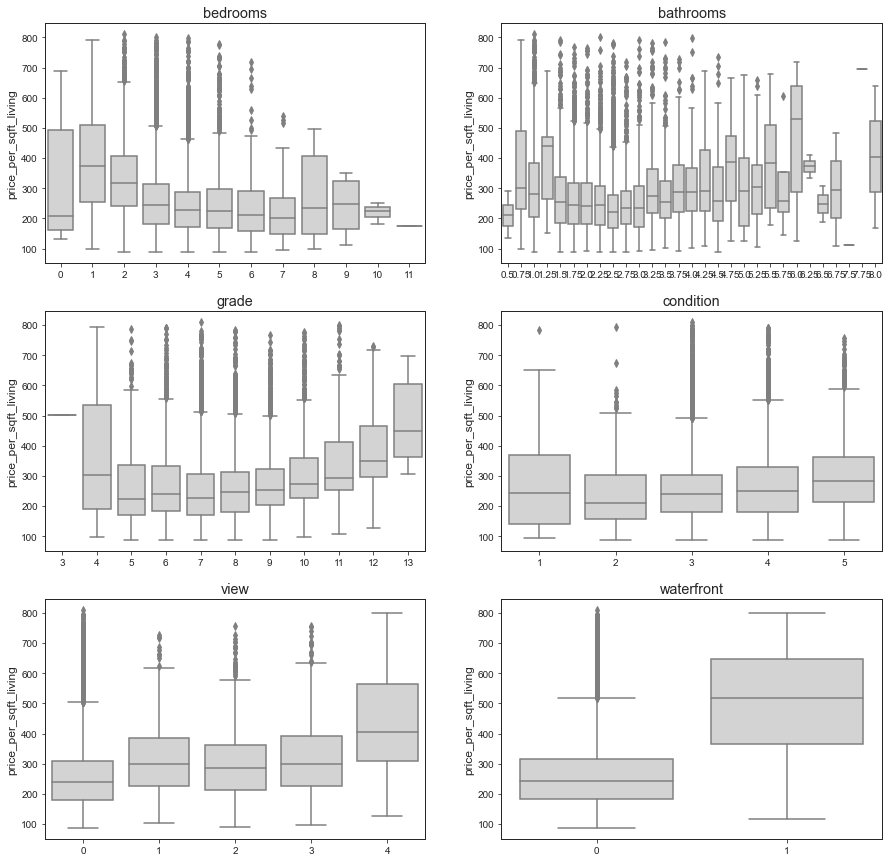

In [12]:
plotvar = ['bedrooms','bathrooms','grade','condition','view','waterfront']


#  Categorical Data
plotcolumns = 2 
plotrows = int(len(plotvar)/plotcolumns)
c = 1  # initialize plot counter

fig = plt.figure(figsize=(15,15))
for i in plotvar:
    plt.subplot(plotrows, plotcolumns, c)
    plt.title(i)
    #plt.xlabel(i)
    sns.boxplot(x = i ,y = 'price_per_sqft_living', data = df, color="lightgray").set(xlabel=None)
    c = c + 1

plt.show()

### 2.3.3 `Grade` and `Condition`  are not linearly correlated
1. From the bubble chart, we notice most of the transacted houses were `grade` 3 and above, and `condition` 7 and above.
2. We would expect houses of a better `grade` to have a better corresponding `condition`. However, the weak negative correlation score does not support this assumption.

In [13]:
# Make a bubble chart for grade and condition, sized by the count of entries
agg_df = df.groupby(['grade','condition'])[['id']].count().rename(columns={"id": "no. of transactions"}).reset_index()

fig = px.scatter(agg_df, x="grade", y="condition",
                 size="no. of transactions", size_max=50,
                 title="No. of transactions by grade and condition")
fig.show()

# Calculate r value
r = df[['grade','condition']].corr().iloc[0,1]
print("r: {}".format(r))

r: -0.14635950239296286


### 2.3.4 Areas with higher `price_per_sqft_living`

We notice homes with higher `price_per_sqft_living` are clustered around downtown and waterfront areas. Hence, we will need to derive useful geolocation data using `lat`, `long` and `postal code`.

In [14]:
import plotly.express as px
px.set_mapbox_access_token(mytoken)

fig = px.scatter_mapbox(df.sort_values(by='price_per_sqft_living'), lat="lat", lon="long",
                        color="price_per_sqft_living", color_continuous_scale=px.colors.sequential.BuPu,
                        #size="sqft_living", size_max=15,
                        opacity=0.5,
                        zoom=10,
                        hover_data=['grade','condition','view']
                        )


fig.show()

# 3 Data Processing

## 3.1 Handle missing values and outliers
Completed in parts 2.2 and 2.3.

## 3.2 Feature engineering

### 3.2.1 Create `age` and `reno_age` variables
1. `age` = year of `date` - `yr_built`
2. `reno_age` = year of `date` - `yr_renovated`

In [15]:
# Age of house
df['date'] = pd.to_datetime(df['date'])
df['age'] = df['date'].dt.year.astype(int) - df['yr_built']

fig = px.scatter(df,x= 'age',y='price_per_sqft_living')
fig.show()

# Age of renovation

# First, replace 0 in yr_renovated with yr_built
df['yr_renovated'] = np.where(df['yr_renovated']==0,df['yr_built'],df['yr_renovated'])

# Caculate age of renovation
df['reno_age'] = df['date'].dt.year.astype(int) - df['yr_renovated']

fig = px.scatter(df,x= 'reno_age',y='price_per_sqft_living')
fig.show()


### 3.2.2 Create `lat_1km` and `long_1km` variables

We can use `lat` and `long` to derive location info that is more granular than postal code.
* 0.1 = 11.1km
* 0.01 = 1.11km
* 0.001 = 111m
* 0.0001 = 11.1m

In [16]:
# Let's bin the lat and long into ~1km grids (i.e. 2dp)

df['lat_1km']=df['lat'].apply(lambda x: float("{:.2f}".format(x)))
df['long_1km']=df['long'].apply(lambda x: float("{:.2f}".format(x)))

df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_per_sqft_living,age,reno_age,lat_1km,long_1km
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,1955,98178,47.5112,-122.257,1340,5650,188.050847,59,59,47.51,-122.26
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,209.338521,63,23,47.72,-122.32
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,1933,98028,47.7379,-122.233,2720,8062,233.766234,82,82,47.74,-122.23
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,1965,98136,47.5208,-122.393,1360,5000,308.163265,49,49,47.52,-122.39
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,1987,98074,47.6168,-122.045,1800,7503,303.571429,28,28,47.62,-122.05


### 3.2.3 Create `basement` variable
There are many 0s in `sqft_basement`. We try to create a categorical `basement` variable where 1 = has basement, 0 = no basement.

In [17]:
df['basement']=df['sqft_basement']
df.loc[df['basement'] >0, 'basement'] = 1

### 3.2.4 Ln transform variables
When fitting the first full model, we see many outliers in `price` that resulted in right-skewness. Hence we do a log transform for `price`.

In [18]:
# ln transform price
df['price_ln'] = np.log(df['price'])


# We also try ln transform on sqft_living, sqft_lot, sqft_above, sqft_basement, sqft_living15 and sqft_lot15 since the values are large
df['sqft_living_ln'] = np.log(df['sqft_living'])
df['sqft_lot_ln'] = np.log(df['sqft_lot'])
df['sqft_above_ln'] = np.log(df['sqft_above'])
df['sqft_basement_ln'] = np.log(df['sqft_basement'])
df['sqft_living15_ln'] = np.log(df['sqft_living15'])
df['sqft_lot15_ln'] = np.log(df['sqft_lot15'])


/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log



### 3.2.5 Drop outliers

In [ ]:
# From the outlier test, we know that id = 3530210260, 1049010620, 1225069038, 2424059170 are outliers
# we drop them from the data

#df.drop(df[df.id == 3530210260].index, inplace=True)
#df.drop(df[df.id == 1049010620].index, inplace=True)
#df.drop(df[df.id == 1225069038].index, inplace=True)
#df.drop(df[df.id == 2424059170].index, inplace=True)


## 3.3 Check final dataset

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21603 entries, 0 to 21612
Data columns (total 34 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     21603 non-null  int64         
 1   date                   21603 non-null  datetime64[ns]
 2   price                  21603 non-null  float64       
 3   bedrooms               21603 non-null  int64         
 4   bathrooms              21603 non-null  float64       
 5   sqft_living            21603 non-null  int64         
 6   sqft_lot               21603 non-null  int64         
 7   floors                 21603 non-null  float64       
 8   waterfront             21603 non-null  int64         
 9   view                   21603 non-null  int64         
 10  condition              21603 non-null  int64         
 11  grade                  21603 non-null  int64         
 12  sqft_above             21603 non-null  int64         
 13  s

# 4. Building the model

## 4.1 Set up functions

In [20]:
# Define function to generate metrics for regression

def regression_metrics(cv):
    print("*"*60)
    modelname = [item for item in steps if item[0]=='model'][0][1]
    print("METHOD: {}".format(modelname))
    print("*"*60,end='\n\n')

    print("Features: {}".format(X.columns.tolist()))
    print("Standardized features: {}".format(to_scale))
    print("Tuned Model Parameters: {}".format(cv.best_params_))

    # Metrics
    print('\n')
    print("========== Metrics ==========" ,end='\n\n')
    r2 = cv.score(X_test, y_test)
    print("R²: {:.3f}".format(r2))
    r2_adj = 1 - ( 1-cv.score(X, y) ) * ( len(y) - 1 ) / ( len(y) - X.shape[1] - 1 )
    print("Adjusted R²: {:.3f}".format(r2_adj))
    rmse = np.sqrt(metrics.mean_squared_error(y_test,y_pred))
    print("RMSE: {}".format(rmse))
    mae = metrics.mean_absolute_error(y_test,y_pred)
    print("MAE: {}".format(mae))
    mape = metrics.mean_absolute_percentage_error(y_test,y_pred)
    print("MAPE: {}".format(mape))

    print('\n')
    print("=== Regression Report ===" ,end='\n\n')
    

    # Plots
    # Calculate residuals
    fittedvalues = cv.predict(X_test)
    rsd = y_test - fittedvalues

    # RESIDUAL PLOTS

    fig, axes = plt.subplots(2, 2, figsize=(10, 10))

    # QQ Plot
    sm.qqplot(rsd,line='s',ax=axes[0, 0], color = 'gray')
    axes[0,0].set_title('Normality Check: QQ plot of Residuals')

    # Residuals vs Fitted Plot
    sns.residplot(fittedvalues, rsd,ax=axes[0, 1], color = 'gray')
    axes[0, 1].set_title('Homoscedasticity Check: Residuals vs Fitted')

    # Histogram
    sns.histplot(rsd, ax=axes[1, 0], color = 'gray')
    axes[1, 0].set_title('Normality Check: Distribution of Residuals')

    # Residuals vs Observations Plot
    axes[1, 1].plot(rsd, color = 'gray')
    axes[1, 1].set_title('Independence Check: Residuals vs Observation')
    
    # ACF Plot
    #plot_acf(rsd, ax=axes[2, 0])
    #axes[2, 0].set_title('Autocorrelation Check: ACF')


    # PACF Plot
    #plot_pacf(rsd, ax=axes[2, 1])
    #axes[2, 1].set_title('Autocorrelation Check: PACF')
    
# --------------------------------------------------------------------------------------   
# Show feature importances by coef
def plot_feature_importance_coef(cv):
    features = X.columns.tolist()
    importances = cv.best_estimator_.named_steps['model'].coef_

    featuredf=pd.DataFrame({'Features':features,'Importances':importances})
    featuredf.sort_values('Importances',inplace=True)

    fig = plt.figure(figsize=(7,4))
    featuredf.plot(kind='barh',y='Importances',x='Features',color='gray')
    plt.xlabel("Coefficients")
    plt.title('Feature Importance')
    plt.show()
    
# --------------------------------------------------------------------------------------       
# Show feature importances by feature_importances
def plot_feature_importance(cv):
    features = X.columns.tolist()
    importances = cv.best_estimator_.named_steps['model'].feature_importances_[0]

    featuredf=pd.DataFrame({'Features':features,'Importances':importances})
    featuredf.sort_values('Importances',inplace=True)

    fig = plt.figure(figsize=(7,4))
    featuredf.plot(kind='barh',y='Importances',x='Features',color='gray')
    plt.xlabel("Feature Importances")
    plt.title('Feature Importance')
    plt.show()
    
# --------------------------------------------------------------------------------------       
# Check permutation importance
def plot_perm_importance(cv):
    perm_importance = permutation_importance(cv, X_train, y_train)

    feature_names = X.columns.tolist()
    features = np.array(feature_names)
    sorted_idx = perm_importance.importances_mean.argsort()

    fig = plt.figure(figsize=(7,4))
    plt.barh(features[sorted_idx], perm_importance.importances_mean[sorted_idx], color = 'gray')
    plt.xlabel("Permutation Importance")
    plt.title('Permutation Importance')
    plt.show()

# --------------------------------------------------------------------------------------       
# Plot predictions vs actual

def plot_predictions(x,y):
    plt.figure(figsize=(5, 5))
    plt.scatter(x, y, s = 8, color = 'gray')
    plt.xlim(10, 16)
    plt.ylim(10, 16)
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.show()
    

# -------------------------------------------
# Export predictions
def export_predictions():
    modelname = [item for item in steps if item[0]=='model'][0][1]
    predictions_df = pd.DataFrame(cv.predict(X_test))
    #actual = pd.DataFrame(y_test)
    predictions_df.to_csv('predictions_'+str(modelname)+'.csv')
    #actual.to_csv('actual_'+str(modelname)+'.csv')

In [21]:
# Statsmodels functions
# Function to fit model and print statistics

def assumcheck_sm(modelname):
    
    rsd_sm = modelname.resid
    
    # RESIDUAL PLOTS
    
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    
    # QQ Plot
    sm.qqplot(rsd_sm,line='s',ax=axes[0, 0], color = 'gray')
    axes[0,0].set_title('Normality Check: QQ plot of Residuals')

    # Residuals vs Fitted Plot
    sns.residplot(modelname.fittedvalues, rsd_sm,ax=axes[0, 1], color = 'gray')
    axes[0, 1].set_title('Homoscedasticity Check: Residuals vs Fitted')
        
    # Histogram
    sns.histplot(rsd_sm, ax=axes[1, 0], color = 'gray')
    axes[1, 0].set_title('Normality Check: Distribution of Residuals')
    
    # Residuals vs Observations Plot
    axes[1, 1].plot(rsd_sm, color = 'gray')
    axes[1, 1].set_title('Independence Check: Residuals vs Observation')
    
    plt.show()
    
    # ACF Plot
    #plot_acf(rsd_sm, ax=axes[2, 0])
    #axes[2, 0].set_title('Autocorrelation Check: ACF')


    # PACF Plot
    #plot_pacf(rsd_sm, ax=axes[2, 1])
    #axes[2, 1].set_title('Autocorrelation Check: PACF')
    
    
    
    
    # NORMALITY CHECKS
    print('***NORMALITY TESTS***')
    
    # JB test
    print('Jarque-Bera Test')
    jbdf = pd.DataFrame(sm.stats.jarque_bera(rsd_sm), index = ['JB','p-value','estimated skewness','estimated kurtosis'])
    print(jbdf)
    # Assessing normality with p values
    if jbdf.iloc[1,0] <alpha:
        print('Reject Ho. Data is NOT normally distributed')
    else:
        print('Do not reject Ho. Data is normally distributed')
    print('\n')
    
    # Omnibus Test
    print('Omnibus Test')
    omnidf = sm.stats.omni_normtest(rsd_sm)
    print(omnidf)
    print('\n')
    
    # SW Test
    print('Shapiro-Wilk Test')
    SWdf = pd.DataFrame(shapiro(rsd_sm),index = ['SW','p-value'])
    print(SWdf)
    # Assessing normality with p values
    if SWdf.iloc[1,0] <alpha:
        print('Reject Ho. Data is NOT normally distributed')
    else:
        print('Do not reject Ho. Data is normally distributed')
    print('\n')
    
    # AD Test
    print('Anderson-Darling Test')
    ADdf = pd.DataFrame(sm.stats.normal_ad(rsd_sm),index = ['AD','p-value'])
    print(ADdf)
    # Assessing normality with p values
    if ADdf.iloc[1,0] <alpha:
        print('Reject Ho. Data is NOT normally distributed')
    else:
        print('Do not reject Ho. Data is normally distributed')
    print('\n\n')
    
    
    
    # HOMOSCEDASTICITY
    print('***HOMOSCEDASTICITY TEST***')
    
    # Breusch-Pagan Test
    print('Breusch-Pagan Test')
    BPdf = pd.DataFrame(sm.stats.het_breuschpagan(rsd_sm, modelname.model.exog),index = ['Lagrange Multiplier Stat', 'p-value (use this)','F-value','F p-value'])
    print(BPdf)
    if BPdf.iloc[1,0] <alpha:
        print('Reject Ho. Data is heteroscedastic (variance NOT constant)')
    else:
        print('Do not reject Ho. Data is homoscedastic (variance is constant)')
    print('\n\n')
    
        
        
        
    # INDEPENDENCE
    print('***INDEPENDENCE TEST***')
    
    # DW Test
    print('Durbin-Watson Test (~2 means no autocorrelation)')
    print('DW Statistic = '+str(sm.stats.durbin_watson(rsd_sm)))
    print('\n\n')
    
    
    
    # MULTICOLLINEARITY
    print('***MULTICOLLINEARITY TESTS***')
    # Correlation Heatmap
    #plt.figure()
    #sns.heatmap(usedf.corr(),annot=True,cmap='coolwarm')
    #plt.title('Correlation Check: Correlation Matrix')
    #plt.show()
    
    # VIF
    print('Variance Inflation Factor (VIF=1: not correlated, 1<VIF<5: moderately correlated, VIF>5: highly correlated)')
    for i in range(len(modelname.model.exog_names)-1):
        print('VIF of', modelname.model.exog_names[i+1], vif(modelname.model.exog,i+1))
    print('\n\n')
    
    
    
    # OUTLIERS (p-value close to zero indicates outlier)
    print('***OUTLIER TEST***')
    ot=modelname.outlier_test()
    #print(ot.loc[ot["bonf(p)"]<alpha]) # Returning the value of the outlier
    display(usedf.loc[ot["bonf(p)"]<alpha])
    print('\n\n')

## 4.2 Explore models
For each model, we
1. Generated feature importances on the full model
2. Performed backward selection of features
3. Split training and testing data 80:20
4. Performed standard scaling
5. Did cross-validation and hyperparameter tuning in every run
6. Analysed residuals
7. Check for outliers and see if removing them improves models

### 4.2.1 Ordinary Least Squares - Full (Statsmodel)
The root mean squared error is rather large and residuals are not random.

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.699
Method:                 Least Squares   F-statistic:                     2355.
Date:                Fri, 25 Feb 2022   Prob (F-statistic):               0.00
Time:                        01:35:52   Log-Likelihood:            -2.3418e+05
No. Observations:               17194   AIC:                         4.684e+05
Df Residuals:                   17176   BIC:                         4.685e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      5.398e+05   1517.843    355.661

/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



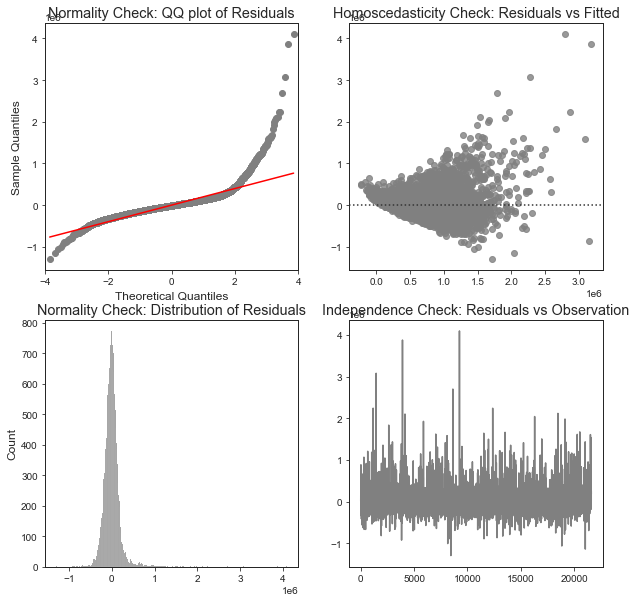

***NORMALITY TESTS***
Jarque-Bera Test
                               0
JB                  1.052834e+06
p-value             0.000000e+00
estimated skewness  3.231926e+00
estimated kurtosis  4.078627e+01
Reject Ho. Data is NOT normally distributed


Omnibus Test
NormaltestResult(statistic=13572.534542857486, pvalue=0.0)


Shapiro-Wilk Test
                0
SW       0.808362
p-value  0.000000
Reject Ho. Data is NOT normally distributed


Anderson-Darling Test
           0
AD       inf
p-value  0.0
Reject Ho. Data is NOT normally distributed



***HOMOSCEDASTICITY TEST***
Breusch-Pagan Test
                                    0
Lagrange Multiplier Stat  2407.614339
p-value (use this)           0.000000
F-value                    164.512159
F p-value                    0.000000
Reject Ho. Data is heteroscedastic (variance NOT constant)



***INDEPENDENCE TEST***
Durbin-Watson Test (~2 means no autocorrelation)
DW Statistic = 1.9972422310508187



***MULTICOLLINEARITY TESTS***
Variance In

/anaconda3/lib/python3.7/site-packages/scipy/stats/morestats.py:1760: UserWarning:

p-value may not be accurate for N > 5000.

/anaconda3/lib/python3.7/site-packages/statsmodels/stats/_adnorm.py:67: RuntimeWarning:

divide by zero encountered in log

/anaconda3/lib/python3.7/site-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning:

divide by zero encountered in double_scalars



VIF of sqft_living15 2.991418447921247
VIF of sqft_lot15 2.112457581911909
VIF of age 6.183482583114318
VIF of reno_age 6.381061291774527
VIF of lat 1.1838867131655006
VIF of long 1.8298545900003305



***OUTLIER TEST***


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_per_sqft_living,age,reno_age,lat_1km,long_1km,basement,price_ln,sqft_living_ln,sqft_lot_ln,sqft_above_ln,sqft_basement_ln,sqft_living15_ln,sqft_lot15_ln
300,3225069065,2014-06-24,3075000.0,0.692879,3.776517,2.726369,0.082592,-0.912069,11.456943,4.920310,-0.629778,2.011276,0.998773,3.742485,2002,2002,-0.075655,0.326140,0.984944,3.754854,0.238929,675.824176,-1.072716,-1.009326,47.61,-122.08,1,14.938815,8.422883,9.833119,7.863267,7.575585,8.422883,9.878580
656,3760500116,2014-11-20,3070000.0,-0.411642,0.509722,2.043456,0.962995,-0.912069,11.456943,4.920310,0.900090,0.298793,0.669317,2.951823,1957,1957,-0.820385,1.024725,-0.063711,1.090205,0.483297,781.170483,0.454733,0.547097,47.70,-122.22,1,14.937188,8.276395,10.930729,7.753624,7.377759,7.912057,10.178236
814,4045100075,2015-03-25,2400000.0,0.692879,2.796478,3.100870,0.000928,0.939967,-0.087283,2.306866,-0.629778,2.867517,1.596675,3.403630,1999,1999,-0.708676,0.000999,-0.085112,2.173634,0.120367,490.797546,-0.936943,-0.870978,47.56,-122.23,1,14.690979,8.494948,9.628261,8.035926,7.495542,8.151910,9.692828
1031,5700004028,2015-04-17,2450000.0,0.692879,2.796478,2.395927,-0.203315,0.939967,-0.087283,3.613588,0.900090,2.011276,1.328229,2.454836,2008,2008,1.227622,0.105534,-0.484599,2.422529,-0.143504,576.470588,-1.242433,-1.182262,47.57,-122.28,1,14.711599,8.354674,8.787526,7.962067,7.229839,8.199739,9.087155
1164,1247600105,2014-10-20,5110800.0,1.797401,4.103196,6.537466,0.718215,0.939967,11.456943,4.920310,-0.629778,3.723759,5.135275,3.900618,1999,1999,-0.839004,0.840887,0.029027,2.115070,0.499932,638.052434,-0.970886,-0.905565,47.68,-122.21,1,15.446867,8.988446,10.725841,8.697847,7.610853,8.140316,10.195709
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21040,6447300365,2014-11-13,2900000.0,1.797401,2.469799,3.431312,-0.012978,0.939967,-0.087283,1.000143,-0.629778,2.867517,4.159110,-0.662631,2013,2013,-0.727294,0.361466,-0.070845,2.715348,0.229680,558.766859,-1.446093,-1.389785,47.61,-122.22,0,14.880221,8.554489,9.588777,8.554489,-inf,8.253228,9.865266
21050,2424059170,2015-02-19,900000.0,1.797401,5.083235,5.557155,0.606799,0.939967,-0.087283,4.920310,-0.629778,3.723759,4.512970,3.042185,2007,2007,-1.341696,-0.107862,0.720997,2.129711,0.860997,126.404494,-1.208489,-1.147675,47.55,-122.11,1,13.710150,8.870663,10.616584,8.608860,7.402452,8.143227,10.514855
21310,2154970020,2014-07-03,2351960.0,0.692879,2.796478,3.233046,0.100827,0.939967,-0.087283,1.000143,-0.629778,2.867517,2.707063,1.618993,2014,2014,-0.708676,-0.104979,0.029027,2.686066,0.151307,469.453094,-1.480036,-1.424373,47.55,-122.21,1,14.670760,8.519191,9.873647,8.294050,6.917706,8.248006,9.744726
21530,8964800330,2015-04-07,3000000.0,0.692879,2.143119,3.321164,-0.007704,-0.912069,-0.087283,-0.306579,-0.629778,2.867517,2.926700,1.393090,2013,2013,-1.378933,0.432117,0.057562,1.529433,-0.003286,589.390963,-1.412149,-1.355198,47.62,-122.21,1,14.914123,8.535033,9.603935,8.338067,6.813445,8.016318,9.453443


In [22]:
# Specify alpha
alpha = 0.05


# -------------------------------------------
# Splitting seed into dftrain:dftest. trainratio is the % of training to testing.

np.random.seed(21)
msk = np.random.rand(len(df)) < 0.8
dftrain = df[msk]
dftest = df[~msk]

# Optional: if you want to export the training data to an Excel file.
#traindf.to_excel('traindf.xlsx', sheet_name='sheet1', index=False)


# -------------------------------------------
# Specify variables to standardize

varstandard = ['bedrooms','bathrooms','sqft_living','sqft_lot','floors','waterfront','view','condition','grade','sqft_above','sqft_basement','zipcode','sqft_living15','sqft_lot15','age','reno_age','lat','long']

# Create the standard scaler (i.e. change X to Z) object, and fit on training data, but selected columns only.

sclr = preprocessing.StandardScaler()
sclr.fit(dftrain[varstandard])

# Copy TRAINING dataframe and standardize columns.

zdftrain = dftrain.copy()
zdftrain[varstandard] = sclr.transform(dftrain[varstandard])

# Copy TESTING dataframe and standardize columns using mean and SD from fitting scaler on training data.

zdftest = dftest.copy()
zdftest[varstandard] = sclr.transform(dftest[varstandard])


# -------------------------------------------
# Specify df
usedf = zdftrain


#Make Model

mlr = ols('price ~ bedrooms + bathrooms + sqft_living + sqft_lot + floors + waterfront + view + condition + grade + sqft_above + sqft_basement + zipcode + sqft_living15 + sqft_lot15 + age + reno_age + lat + long',usedf).fit()
# full model: 'price ~ bedrooms + bathrooms + sqft_living + sqft_lot + floors + waterfront + view + condition + grade + sqft_above + sqft_basement + zipcode + sqft_living15 + sqft_lot15 + age + reno_age + lat + long'
print(mlr.summary())
print("\nMSE =", mlr.mse_resid)


assumcheck_sm(mlr)

### 4.2.2 Ordinary Least Squares - Backward selection (Statsmodel)
The root mean squared error is rather large and residuals are not random.

Rows before dropping: 21603
Rows after dropping: 21598
                            OLS Regression Results                            
Dep. Variable:               price_ln   R-squared:                       0.760
Model:                            OLS   Adj. R-squared:                  0.760
Method:                 Least Squares   F-statistic:                     6052.
Date:                Fri, 25 Feb 2022   Prob (F-statistic):               0.00
Time:                        01:39:43   Log-Likelihood:                -1009.0
No. Observations:               17189   AIC:                             2038.
Df Residuals:                   17179   BIC:                             2116.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



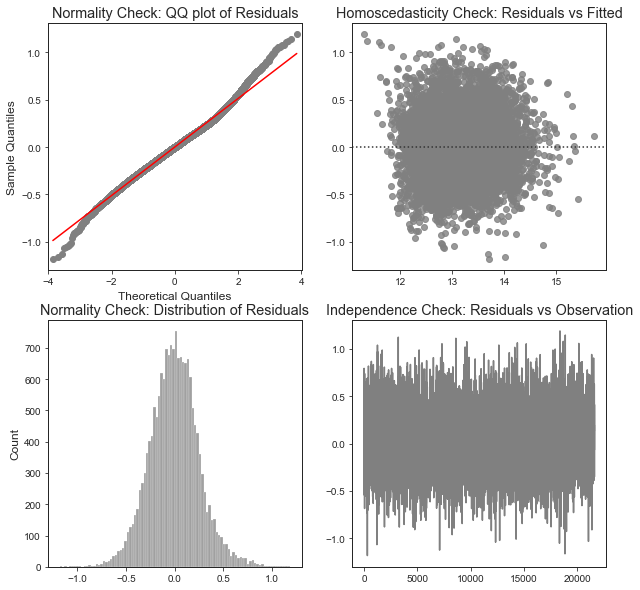

***NORMALITY TESTS***
Jarque-Bera Test
                                0
JB                   6.025016e+02
p-value             1.473813e-131
estimated skewness   1.607547e-01
estimated kurtosis   3.858993e+00
Reject Ho. Data is NOT normally distributed


Omnibus Test
NormaltestResult(statistic=341.99679996823033, pvalue=5.4492718292584325e-75)


Shapiro-Wilk Test
                    0
SW       9.935434e-01
p-value  7.302894e-27
Reject Ho. Data is NOT normally distributed


Anderson-Darling Test
                 0
AD       19.650832
p-value   0.000000
Reject Ho. Data is NOT normally distributed



***HOMOSCEDASTICITY TEST***
Breusch-Pagan Test
                                     0
Lagrange Multiplier Stat  4.807851e+02
p-value (use this)        7.460542e-98
F-value                   5.492579e+01
F p-value                 2.791417e-99
Reject Ho. Data is heteroscedastic (variance NOT constant)



***INDEPENDENCE TEST***
Durbin-Watson Test (~2 means no autocorrelation)
DW Statistic = 1.97

/anaconda3/lib/python3.7/site-packages/scipy/stats/morestats.py:1760: UserWarning:

p-value may not be accurate for N > 5000.



,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,price_per_sqft_living,age,reno_age,lat_1km,long_1km,basement,price_ln,sqft_living_ln,sqft_lot_ln,sqft_above_ln,sqft_basement_ln,sqft_living15_ln,sqft_lot15_ln


In [23]:
# Specify alpha
alpha = 0.05

# -------------------------------------------
# Drop outliers
print('Rows before dropping: '+str(df.shape[0]))
df.drop(index = [4390,8606,9563,12551,17363], inplace = True)
print('Rows after dropping: '+str(df.shape[0]))

# -------------------------------------------
# Splitting seed into dftrain:dftest. trainratio is the % of training to testing.

np.random.seed(21)
msk = np.random.rand(len(df)) < 0.8
dftrain = df[msk]
dftest = df[~msk]

# Optional: if you want to export the training data to an Excel file.
#traindf.to_excel('traindf.xlsx', sheet_name='sheet1', index=False)

# -------------------------------------------
# Specify variables to standardize

varstandard = ['bedrooms','bathrooms','sqft_living_ln','sqft_living','sqft_lot','floors','waterfront','view','condition','grade','sqft_above','sqft_basement','zipcode','sqft_living15','sqft_lot15','age','reno_age','lat','long']

# Create the standard scaler (i.e. change X to Z) object, and fit on training data, but selected columns only.

sclr = preprocessing.StandardScaler()
sclr.fit(dftrain[varstandard])

# Copy TRAINING dataframe and standardize columns.

zdftrain = dftrain.copy()
zdftrain[varstandard] = sclr.transform(dftrain[varstandard])

# Copy TESTING dataframe and standardize columns using mean and SD from fitting scaler on training data.

zdftest = dftest.copy()
zdftest[varstandard] = sclr.transform(dftest[varstandard])


# -------------------------------------------
# Specify df
usedf = zdftrain


#Make Model

mlr = ols('price_ln ~ bathrooms + sqft_living_ln + floors + waterfront + view + condition + grade + age + lat',usedf).fit()
# full model: 'price ~ bedrooms + bathrooms + sqft_living + sqft_lot + floors + waterfront + view + condition + grade + sqft_above + sqft_basement + zipcode + sqft_living15 + sqft_lot15 + age + reno_age + lat + long'
print(mlr.summary())
print("\nMSE =", mlr.mse_resid)

assumcheck_sm(mlr)

### 4.2.3 Lasso Regression
The root mean squared error is rather large and residuals are not random.

Rows before dropping: 21598
Rows after dropping: 21598
************************************************************
METHOD: Lasso()
************************************************************

Features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
Standardized features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
Tuned Model Parameters: {'model__alpha': 0.01}


========== Metrics ==========

R²: 0.759
Adjusted R²: 0.760
RMSE: 0.257135595052585
MAE: 0.19876862519469266
MAPE: 0.01523746538395537


=== Regression Report ===



/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



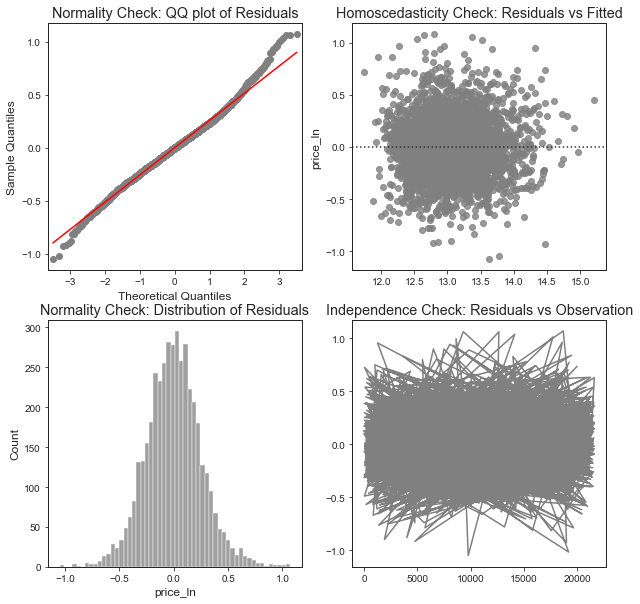

<Figure size 504x288 with 0 Axes>

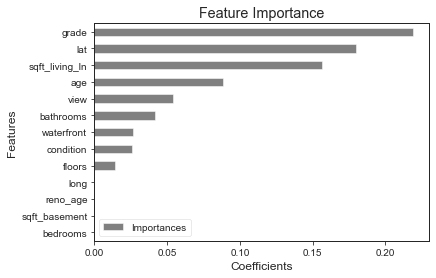

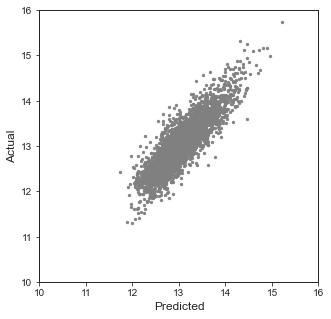

In [24]:
from sklearn import linear_model

# -------------------------------------------
# Drop outliers
print('Rows before dropping: '+str(df.shape[0]))
#df.drop(index = [4390,8606,9563,12551,17363], inplace = True)
print('Rows after dropping: '+str(df.shape[0]))

# -------------------------------------------
# Specify variables
y = df['price_ln']
X = df[['bedrooms','bathrooms','sqft_living_ln','floors','waterfront','view','condition','grade','sqft_basement','age','reno_age','lat','long']]
to_scale = ['bedrooms','bathrooms','sqft_living_ln','floors','waterfront','view','condition','grade','sqft_basement','age','reno_age','lat','long']



# -------------------------------------------
# Set up pipeline
preprocessor = ColumnTransformer([('scaler', preprocessing.StandardScaler(),to_scale)],
                                 remainder='passthrough')

steps = [('preprocessor', preprocessor),
         ("model", linear_model.Lasso())
        ]
    
pipeline = Pipeline(steps)

# -------------------------------------------
# Specify hyperparameter space
parameters = {"model__alpha":[0.9,0.5,0.3,0.1,0.01]
             }

# -------------------------------------------
# Create train and test sets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=21)


# Instantiate the GridSearchCV object: cv
cv = model_selection.GridSearchCV(pipeline,parameters, cv = 5)

# Fit to the training set
cv.fit(X_train,y_train)

# Predict the labels of the set: y_pred
y_pred = cv.predict(X_test)


regression_metrics(cv)
plot_feature_importance_coef(cv)
plot_predictions(y_pred,y_test)
export_predictions()


### 4.2.4 Ridge Regression
The root mean squared error is rather large and residuals are not random.

Rows before dropping: 21598
Rows after dropping: 21598
************************************************************
METHOD: Ridge()
************************************************************

Features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
Standardized features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
Tuned Model Parameters: {'model__alpha': 0.9}


========== Metrics ==========

R²: 0.765
Adjusted R²: 0.764
RMSE: 0.25412552103923297
MAE: 0.19632757425942207
MAPE: 0.01504918515993036


=== Regression Report ===



/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



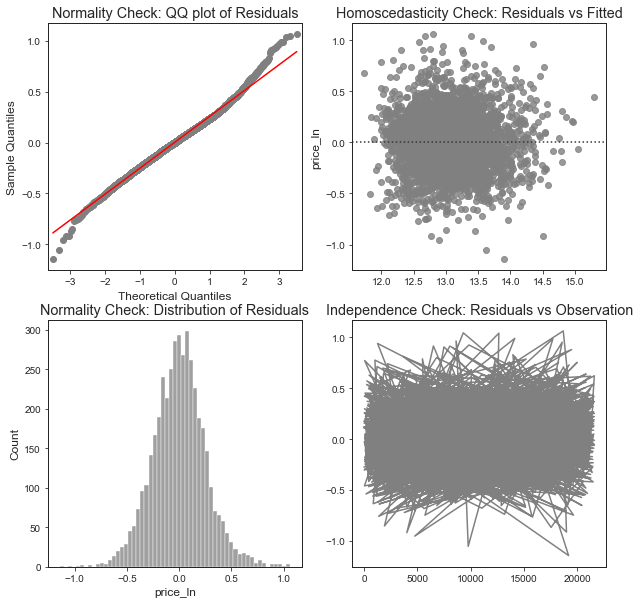

<Figure size 504x288 with 0 Axes>

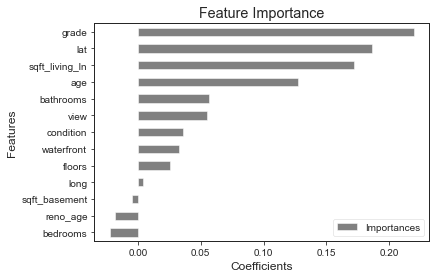

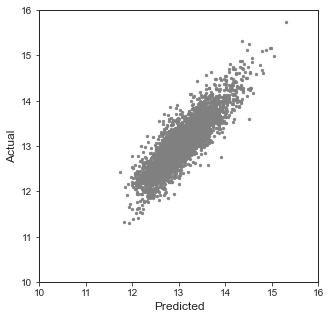

In [25]:
from sklearn import linear_model

# -------------------------------------------
# Drop outliers
print('Rows before dropping: '+str(df.shape[0]))
#df.drop(df[df.price > 1000000].index, inplace=True)
print('Rows after dropping: '+str(df.shape[0]))

# -------------------------------------------
# Specify variables
y = df['price_ln']
X = df[['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']]
to_scale = ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
         
# -------------------------------------------
# Set up pipeline
preprocessor = ColumnTransformer([('scaler', preprocessing.StandardScaler(),to_scale)],
                                 remainder='passthrough')

steps = [('preprocessor', preprocessor),
         ("model", linear_model.Ridge())
        ]
    
pipeline = Pipeline(steps)

# -------------------------------------------
# Specify hyperparameter space
parameters = {"model__alpha":[0.9,0.5,0.3,0.1,0.01]
             }

# -------------------------------------------
# Create train and test sets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=21)


# Instantiate the GridSearchCV object: cv
cv = model_selection.GridSearchCV(pipeline,parameters, cv = 5)

# Fit to the training set
cv.fit(X_train,y_train)

# Predict the labels of the set: y_pred
y_pred = cv.predict(X_test)


regression_metrics(cv)
plot_feature_importance_coef(cv)
plot_predictions(y_pred,y_test)
export_predictions()

### 4.2.4 CART Regression
The root mean squared error is rather large and residuals are not random.

************************************************************
METHOD: DecisionTreeRegressor()
************************************************************

Features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
Standardized features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
Tuned Model Parameters: {'model__max_depth': 9, 'model__max_features': 'auto', 'model__splitter': 'best'}


========== Metrics ==========

R²: 0.829
Adjusted R²: 0.861
RMSE: 0.21706664106175513
MAE: 0.15918964830458165
MAPE: 0.012212471583223845


=== Regression Report ===



/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



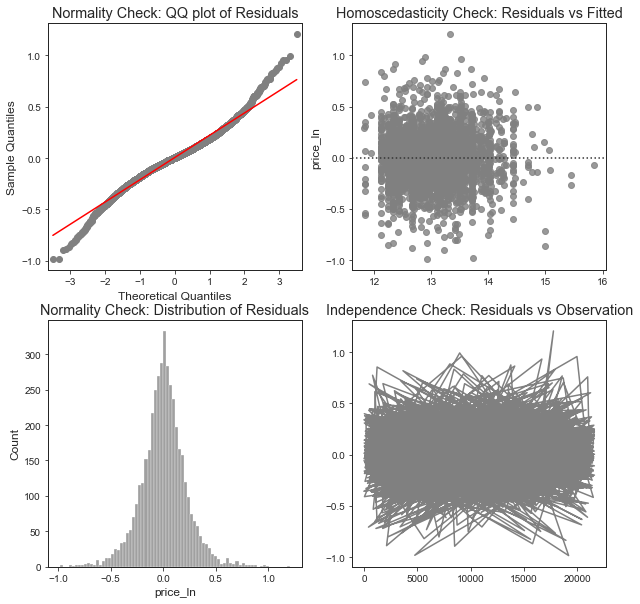

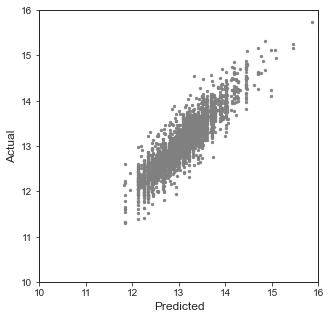

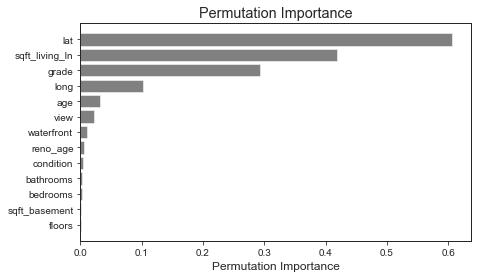

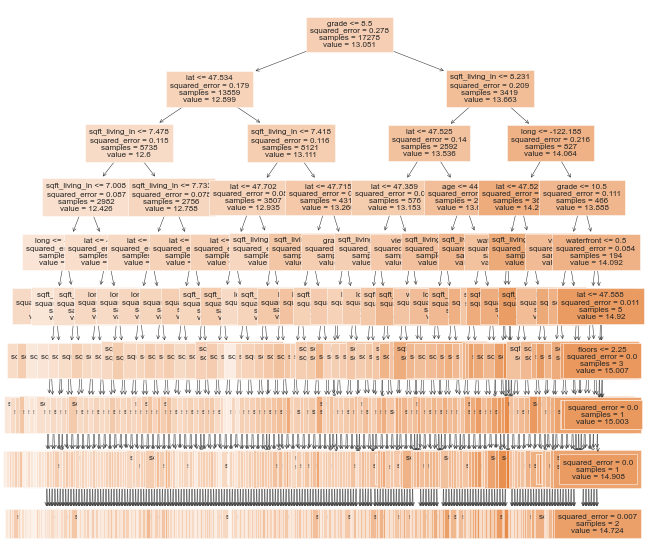

In [26]:
from sklearn.tree import DecisionTreeRegressor


# Choose variables to model
y = df['price_ln']
X = df[['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']]
to_scale = ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'age', 'reno_age', 'lat', 'long']
         

# Set up pipeline
preprocessor = ColumnTransformer([('scaler', preprocessing.StandardScaler(),to_scale)],
                                 remainder='passthrough')

steps = [('preprocessor', preprocessor),
         ("model", DecisionTreeRegressor())
        ]
    
pipeline = Pipeline(steps)

# Specify hyperparameter space
parameters = {"model__max_depth":range(1,10),
              "model__splitter":["best","random"],
              #"model__min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
              #"model__min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
              "model__max_features":["auto","log2","sqrt",None],
              #"model__max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90]
             }


# Create train and test sets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=21)


# Instantiate the GridSearchCV object: cv
cv = model_selection.GridSearchCV(pipeline, parameters, cv = 5)

# Fit to the training set
cv.fit(X_train,y_train)

# Predict the labels of the set: y_pred
y_pred = cv.predict(X_test)


regression_metrics(cv)
plot_predictions(y_pred,y_test)

plot_perm_importance(cv)

# Plot tree
from sklearn import tree
fig = plt.figure(figsize = (10,10))
graph = tree.plot_tree(DecisionTreeRegressor(max_depth= 9, splitter = 'best').fit(X_train,y_train),
                   feature_names=X.columns,
                       fontsize=8,
                   filled=True)



### 4.2.4 Elastic Net Regression
The root mean squared error is rather large and residuals are not random.

Rows before dropping: 21598
Rows after dropping: 782
************************************************************
METHOD: ElasticNet()
************************************************************

Features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'age', 'reno_age', 'lat']
Standardized features: ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'age', 'reno_age', 'lat']
Tuned Model Parameters: {'model__alpha': 0.01, 'model__l1_ratio': 0.5}


========== Metrics ==========

R²: 0.510
Adjusted R²: 0.569
RMSE: 0.33405954565621426
MAE: 0.2664491675854447
MAPE: 0.01885332807452369


=== Regression Report ===



/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



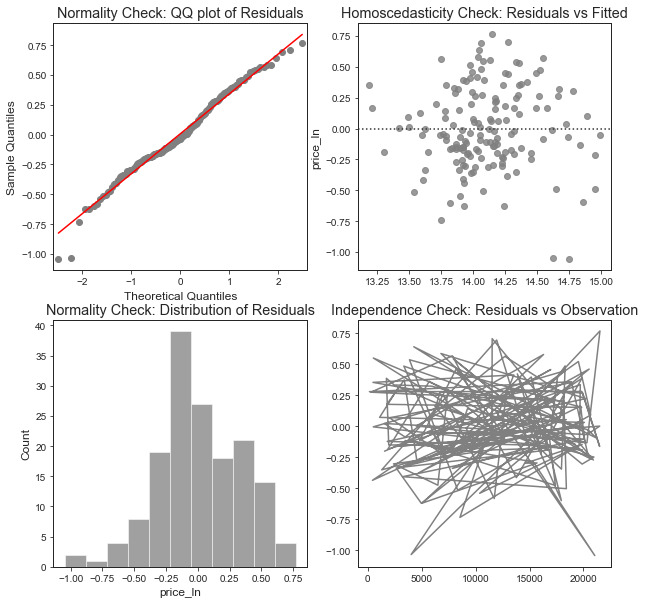

<Figure size 504x288 with 0 Axes>

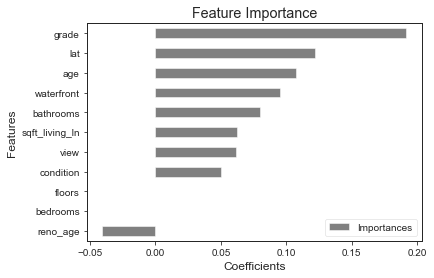

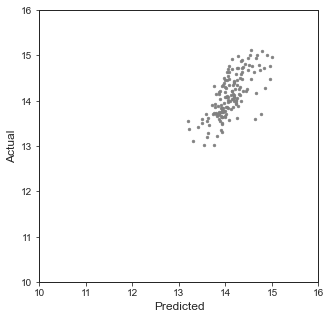

In [27]:
from sklearn.linear_model import ElasticNet

# -------------------------------------------
# Drop outliers
print('Rows before dropping: '+str(df.shape[0]))
df_new = df.drop(df[df.sqft_living <= 4000].index)
#df_new = df.drop(df[(df.zipcode == 98039) | (df.zipcode == 98004)].index)
#df_new = df_new.drop(df_new[df_new.price >6000000].index)

print('Rows after dropping: '+str(df_new.shape[0]))

# -------------------------------------------
# Specify variables
y = df_new['price_ln']
X = df_new[['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'age', 'reno_age', 'lat']]
to_scale = ['bedrooms', 'bathrooms', 'sqft_living_ln', 'floors', 'waterfront', 'view', 'condition', 'grade', 'age', 'reno_age', 'lat']
         
# -------------------------------------------
# Set up pipeline
preprocessor = ColumnTransformer([('scaler', preprocessing.StandardScaler(),to_scale)],
                                 remainder='passthrough')

steps = [('preprocessor', preprocessor),
         ("model", ElasticNet())
        ]
    
pipeline = Pipeline(steps)

# -------------------------------------------
# Specify hyperparameter space
parameters = {"model__alpha":[0.9, 0.5, 0.1, 0.01, 0.001],
              "model__l1_ratio": [0.9, 0.5, 0.1, 0.01, 0.001]
             }

# -------------------------------------------
# Create train and test sets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=21)


# Instantiate the GridSearchCV object: cv
cv = model_selection.GridSearchCV(pipeline,parameters, cv = 5)

# Fit to the training set
cv.fit(X_train,y_train)

# Predict the labels of the set: y_pred
y_pred = cv.predict(X_test)



regression_metrics(cv)
plot_feature_importance_coef(cv)
plot_predictions(y_pred,y_test)
export_predictions()

actual = pd.DataFrame(y_test)
actual.to_csv('actual.csv')

### 4.2.5 Support Vector Regression
The root mean squared error is rather large and residuals are not random. The runtime is too long.

In [ ]:
from sklearn.svm import SVR

y = df['price_ln']
X = df[['bedrooms','bathrooms','sqft_living','sqft_lot','floors','waterfront','view','condition','grade','sqft_above','sqft_basement','zipcode','sqft_living15','sqft_lot15','age','reno_age','lat','long']]
to_scale = ['bedrooms','bathrooms','sqft_living','sqft_lot','floors','waterfront','view','condition','grade','sqft_above','sqft_basement','zipcode','sqft_living15','sqft_lot15','age','reno_age','lat','long']
         

# Set up pipeline
preprocessor = ColumnTransformer([('scaler', preprocessing.StandardScaler(),to_scale)],
                                 remainder='passthrough')

steps = [('preprocessor', preprocessor),
         ("model", SVR())
        ]
    
pipeline = Pipeline(steps)

# Specify hyperparameter space
parameters = {"model__kernel":('linear', 'rbf'),
              #"model__C": [1, 10, 100]
             }


# Create train and test sets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=21)


# Instantiate the GridSearchCV object: cv
cv = model_selection.GridSearchCV(pipeline,parameters, cv = 5)

# Fit to the training set
cv.fit(X_train,y_train)

# Predict the labels of the set: y_pred
y_pred = cv.predict(X_test)


regression_metrics(cv)
plot_perm_importance(cv)

### 4.2.5 K Nearest Neighbours Regression
The root mean squared error is rather large and residuals are not random.

Rows before dropping: 21598
Rows after dropping: 782
************************************************************
METHOD: KNeighborsRegressor()
************************************************************

Features: ['sqft_living_ln', 'view', 'grade', 'age', 'lat', 'long']
Standardized features: ['sqft_living_ln', 'view', 'grade', 'age', 'lat', 'long']
Tuned Model Parameters: {'model__n_neighbors': 11, 'model__weights': 'distance'}


========== Metrics ==========

R²: 0.860
Adjusted R²: 0.972
RMSE: 0.1961516270833536
MAE: 0.1389861602321601
MAPE: 0.010678405948537762


=== Regression Report ===



/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



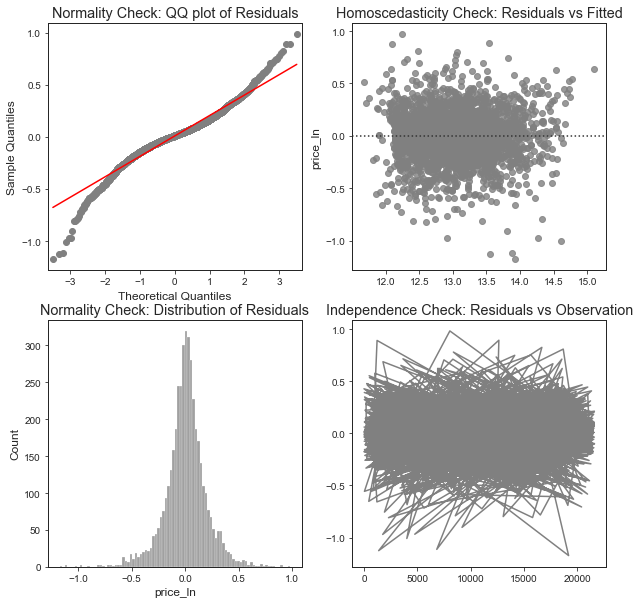

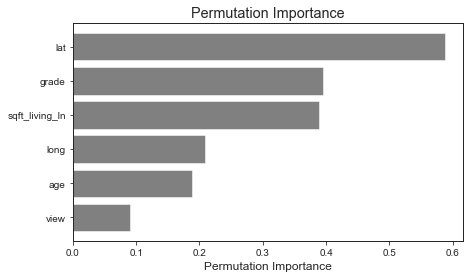

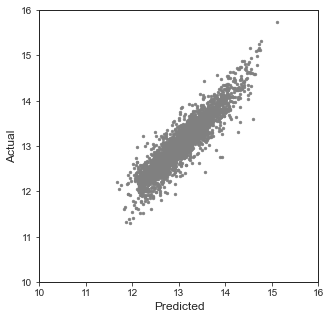

In [28]:
from sklearn.neighbors import KNeighborsRegressor


# -------------------------------------------
# Drop outliers
print('Rows before dropping: '+str(df.shape[0]))
#df_new = df.drop(df[df.sqft_living <= 4000].index)
#df_new = df.drop(df[(df.zipcode == 98039) | (df.zipcode == 98004)].index)
#df_new = df_new.drop(df_new[df_new.price >6000000].index)
print('Rows after dropping: '+str(df_new.shape[0]))


# -------------------------------------------
# Specify variables
y = df['price_ln']
X = df[['sqft_living_ln','view','grade','age','lat','long']]
to_scale = ['sqft_living_ln','view','grade','age','lat','long']
#best = 'sqft_living_ln','view','grade','age','lat','long'

# -------------------------------------------
# Set up pipeline
preprocessor = ColumnTransformer([('scaler', preprocessing.StandardScaler(),to_scale)],
                                 remainder='passthrough')

steps = [('preprocessor', preprocessor),
         ("model", KNeighborsRegressor())
        ]
    
pipeline = Pipeline(steps)

# -------------------------------------------
# Specify hyperparameter space
parameters = {"model__n_neighbors":[5,9,11,15],
              "model__weights": ['uniform','distance']
             }

# -------------------------------------------
# Create train and test sets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=21)


# Instantiate the GridSearchCV object: cv
cv = model_selection.GridSearchCV(pipeline,parameters, cv = 5)

# Fit to the training set
cv.fit(X_train,y_train)

# Predict the labels of the set: y_pred
y_pred = cv.predict(X_test)

regression_metrics(cv)
plot_perm_importance(cv)
plot_predictions(y_pred,y_test)
export_predictions()

actual = pd.DataFrame(y_test)
actual.to_csv('actual.csv')

### 4.2.6 XGBoost
XGBoost had the lowest error at USD 121,422 after tuning hyperparameters. We try to improve this by:
1. Square root transformation on price. RMSE = 123,730

2. Splitting by postal code. RMSE = 119,760

3. Dropping outliers (price > 3M). RMSE = 110,920, dropped 50 records

4. Dropping outliers (price > 2M). RMSE = 100,879, dropped 205 records

5. Split by postal code and remove outliers. RMSE = 89,842, dropped 237 records

**Method 5: the best approach**

Using method 5, we generated two XGB models for different regions (downtown vs non-downtown), using the same features but different weights. The residuals show some deviance from normality, but not too serious.
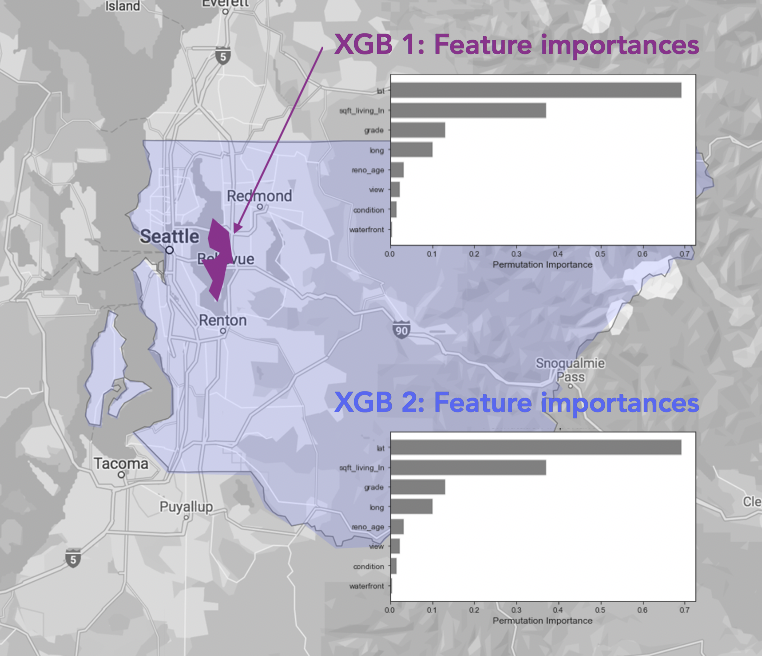

Rows before dropping: 21598
Rows after dropping: 20560
Fitting 5 folds for each of 1 candidates, totalling 5 fits
************************************************************
METHOD: XGBRegressor(n_estimators=1000, objective='reg:squarederror', seed=21)
************************************************************

Features: ['sqft_living_ln', 'condition', 'waterfront', 'view', 'grade', 'reno_age', 'lat', 'long']
Standardized features: ['sqft_living_ln', 'condition', 'waterfront', 'view', 'grade', 'reno_age', 'lat', 'long']
Tuned Model Parameters: {'model__alpha': 0.9, 'model__lambda': 0.9, 'model__lambda_bias': 0.9}


========== Metrics ==========

R²: 0.871
Adjusted R²: 0.894
RMSE: 0.1665811744052114
MAE: 0.1209673333822106
MAPE: 0.009371166377861248


=== Regression Report ===



/anaconda3/lib/python3.7/site-packages/statsmodels/graphics/gofplots.py:847: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



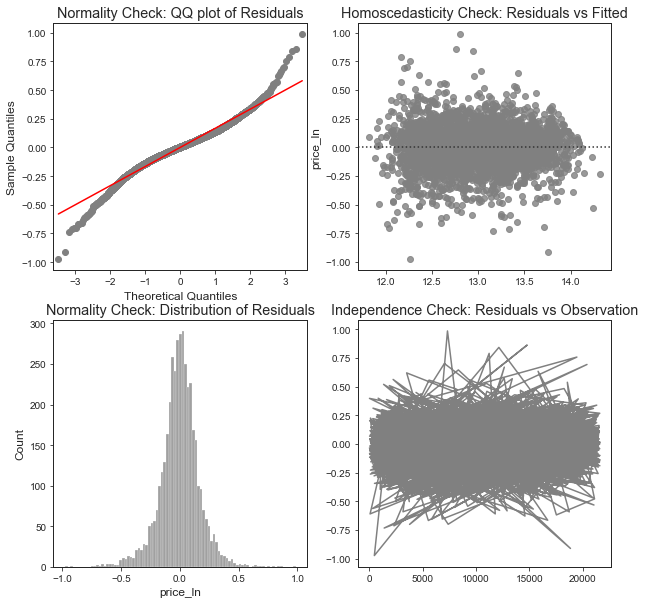

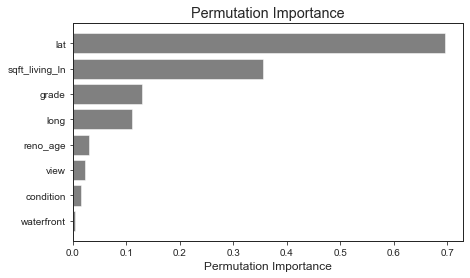

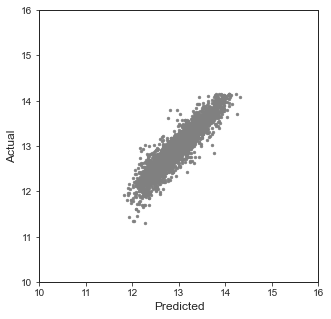

In [29]:
import xgboost as xgb

# -------------------------------------------
# Drop outliers
print('Rows before dropping: '+str(df.shape[0]))
#df_new = df.drop(df[df.sqft_living <= 4000].index)
df_new = df.drop(df[(df.zipcode == 98039) | (df.zipcode == 98004) | (df.zipcode == 98040)].index)
df_new = df_new.drop(df_new[(df_new.price >1400000)].index)
print('Rows after dropping: '+str(df_new.shape[0]))

#df['price_sqrt']=np.sqrt(df['price'])

# -------------------------------------------
# Specify variables
y = df_new['price_ln']
X = df_new[['sqft_living_ln', 'condition', 'waterfront', 'view', 'grade', 'reno_age', 'lat', 'long']]
to_scale = ['sqft_living_ln', 'condition', 'waterfront', 'view', 'grade', 'reno_age', 'lat', 'long']

# -------------------------------------------
# Set up pipeline
preprocessor = ColumnTransformer([('scaler', preprocessing.StandardScaler(),to_scale)],
                                 remainder='passthrough')

steps = [('preprocessor', preprocessor),
         ("model", xgb.XGBRegressor(objective='reg:squarederror',n_estimators=1000,seed=21)),
        ]
    
pipeline = Pipeline(steps)

# -------------------------------------------
# Specify hyperparameter space
parameters = {'model__lambda':[0.9],
              'model__alpha': [0.9],
              'model__lambda_bias':[0.9]
             }

# -------------------------------------------
# Create train and test sets
X_train, X_test, y_train, y_test = model_selection.train_test_split(X,y,test_size=0.2,random_state=21)


# Instantiate the GridSearchCV object: cv
cv = model_selection.GridSearchCV(pipeline,
                                  param_grid = parameters,
                                  scoring = None,
                                  cv = 5, verbose = 1)

# Fit to the training set
cv.fit(X_train,y_train)

# Predict the labels of the set: y_pred
y_pred = cv.predict(X_test)


regression_metrics(cv)
plot_perm_importance(cv)
plot_predictions(y_pred,y_test)

export_predictions()

actual = pd.DataFrame(y_test)
actual.to_csv('actual.csv')

# 5 Conclusion and learning points

The objective was to predict housing prices in King County. For this task, we try to minimize RMSE in the predictions. We tried transformations, different algorithms, splitting models etc.

Data was from 2014 to 2015. It’s too short to do a time series to predict prices now in 2021, but we can do a simple extrapolation based on annual growth rates.

We try to minimize and “de-trend” the errors as much as possible, but sometimes they still exist.

We tried to establish a systematic way of choosing the best features and model:
1. Feature selection has the greatest impact on the RMSE. Transforming variables can have a notable impact too.
2. Next, the algorithm has a notable impact too. While the strongest predictors are generally the same across algorithms, different algorithms may choose a different set of predictors.
3. Lastly, hyperparameter tuning would help to improve the model marginally.

**The best model was a combination of two XGBoost models - one for the downtown area and other for the non-downtown area.**